### **Getting the Data and Analyzing Its Structure**

In [23]:
import numpy as np  # For numerical operations
import pandas as pd  # For data manipulation
import matplotlib.pyplot as plt  # For static visualizations
import seaborn as sns  # For enhanced visualizations
from scipy.stats import skew, kurtosis

# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings("ignore")

# Set global style for visualizations
sns.set_style("whitegrid")
plt.rcParams["figure.figsize"] = (10, 6)

The dataset used in this analysis is the **Students Grading Dataset**, which contains student performance metrics.

In [24]:
df  = pd.read_csv("Students_Grading_Dataset.csv")

print("First 5 records:")
df.head()

First 5 records:


,Student_ID,First_Name,Last_Name,Email,Gender,Age,Department,Attendance (%),Midterm_Score,Final_Score,...,Projects_Score,Total_Score,Grade,Study_Hours_per_Week,Extracurricular_Activities,Internet_Access_at_Home,Parent_Education_Level,Family_Income_Level,Stress_Level (1-10),Sleep_Hours_per_Night
0,S1000,Omar,Williams,student0@university.com,Female,22,Engineering,52.29,55.03,57.82,...,85.90,56.09,F,6.2,No,Yes,High School,Medium,5,4.7
1,S1001,Maria,Brown,student1@university.com,Male,18,Engineering,97.27,97.23,45.80,...,55.65,50.64,A,19.0,No,Yes,NaN,Medium,4,9.0
2,S1002,Ahmed,Jones,student2@university.com,Male,24,Business,57.19,67.05,93.68,...,73.79,70.30,D,20.7,No,Yes,Master's,Low,6,6.2
3,S1003,Omar,Williams,student3@university.com,Female,24,Mathematics,95.15,47.79,80.63,...,92.12,61.63,A,24.8,Yes,Yes,High School,High,3,6.7
4,S1004,John,Smith,student4@university.com,Female,23,CS,54.18,46.59,78.89,...,68.42,66.13,F,15.4,Yes,Yes,High School,High,2,7.1


In [25]:
print("\nDataset Information:")
df.info()


Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 23 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Student_ID                  5000 non-null   object 
 1   First_Name                  5000 non-null   object 
 2   Last_Name                   5000 non-null   object 
 3   Email                       5000 non-null   object 
 4   Gender                      5000 non-null   object 
 5   Age                         5000 non-null   int64  
 6   Department                  5000 non-null   object 
 7   Attendance (%)              4484 non-null   float64
 8   Midterm_Score               5000 non-null   float64
 9   Final_Score                 5000 non-null   float64
 10  Assignments_Avg             4483 non-null   float64
 11  Quizzes_Avg                 5000 non-null   float64
 12  Participation_Score         5000 non-null   float64
 13  Projects_Sc

In [26]:
print("\nSummary Statistics:")
df.describe()


Summary Statistics:


,Age,Attendance (%),Midterm_Score,Final_Score,Assignments_Avg,Quizzes_Avg,Participation_Score,Projects_Score,Total_Score,Study_Hours_per_Week,Stress_Level (1-10),Sleep_Hours_per_Night
count,5000.000000,4484.000000,5000.000000,5000.000000,4483.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000
mean,21.048400,75.431409,70.326844,69.640788,74.798673,74.910728,4.980024,74.924860,75.121804,17.658860,5.48080,6.488140
std,1.989786,14.372446,17.213209,17.238744,14.411799,14.504281,2.890136,14.423415,14.399941,7.275864,2.86155,1.452283
min,18.000000,50.010000,40.000000,40.000000,50.000000,50.030000,0.000000,50.010000,50.020000,5.000000,1.00000,4.000000
25%,19.000000,63.265000,55.457500,54.667500,62.090000,62.490000,2.440000,62.320000,62.835000,11.400000,3.00000,5.200000
50%,21.000000,75.725000,70.510000,69.735000,74.810000,74.695000,4.955000,74.980000,75.395000,17.500000,5.00000,6.500000
75%,23.000000,87.472500,84.970000,84.500000,86.970000,87.630000,7.500000,87.367500,87.652500,24.100000,8.00000,7.700000
max,24.000000,100.000000,99.980000,99.980000,99.980000,99.960000,10.000000,100.000000,99.990000,30.000000,10.00000,9.000000


In [27]:
print(f"\nDataset Shape: {df.shape}")


Dataset Shape: (5000, 23)


In [28]:
categorical_columns = df.select_dtypes(include=['object']).columns

# Display unique values for each categorical column
for col in categorical_columns:
    print(f"{col}: {df[col].nunique()} unique values")
    print(df[col].unique(), "\n")

Student_ID: 5000 unique values
['S1000' 'S1001' 'S1002' ... 'S5997' 'S5998' 'S5999'] 

First_Name: 8 unique values
['Omar' 'Maria' 'Ahmed' 'John' 'Liam' 'Sara' 'Emma' 'Ali'] 

Last_Name: 6 unique values
['Williams' 'Brown' 'Jones' 'Smith' 'Davis' 'Johnson'] 

Email: 5000 unique values
['student0@university.com' 'student1@university.com'
 'student2@university.com' ... 'student4997@university.com'
 'student4998@university.com' 'student4999@university.com'] 

Gender: 2 unique values
['Female' 'Male'] 

Department: 4 unique values
['Engineering' 'Business' 'Mathematics' 'CS'] 

Grade: 5 unique values
['F' 'A' 'D' 'B' 'C'] 

Extracurricular_Activities: 2 unique values
['No' 'Yes'] 

Internet_Access_at_Home: 2 unique values
['Yes' 'No'] 

Parent_Education_Level: 4 unique values
['High School' nan "Master's" 'PhD' "Bachelor's"] 

Family_Income_Level: 3 unique values
['Medium' 'Low' 'High'] 



#### Data Cleaning

In [29]:
df.drop(columns=['Student_ID', 'First_Name', 'Last_Name', 'Email'], inplace=True)

In [30]:
missing_values = df.isnull().sum()
print("\nMissing Values:")
print(missing_values[missing_values > 0])


Missing Values:
Attendance (%)             516
Assignments_Avg            517
Parent_Education_Level    1794
dtype: int64


In [31]:
df.fillna(df.mean(numeric_only=True), inplace=True)

# Fill categorical columns with the mode
df['Parent_Education_Level'].fillna('Unknown', inplace=True)
df.fillna(df.mode().iloc[0], inplace=True)

In [32]:
df.drop_duplicates(inplace=True)

#### Handling Outliers

In [33]:

def handle_outliers_iqr(data, column):

    Q1 = data[column].quantile(0.25)  # 25th percentile
    Q3 = data[column].quantile(0.75)  # 75th percentile
    IQR = Q3 - Q1  # Interquartile range
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Cap values beyond the limits
    data[column] = data[column].apply(lambda x: lower_bound if x < lower_bound else upper_bound if x > upper_bound else x)

# Apply the function to all numerical columns
num_cols = df.select_dtypes(include=['number']).columns
for col in num_cols:
    handle_outliers_iqr(df, col)

print("\nOutliers have been handled using the IQR method")


Outliers have been handled using the IQR method


In [34]:
def detect_outliers_iqr(data, column):
    """
    Detect outliers in a numerical column using the Interquartile Range (IQR) method.
    """
    Q1 = data[column].quantile(0.25)  # 25th percentile
    Q3 = data[column].quantile(0.75)  # 75th percentile
    IQR = Q3 - Q1  # Interquartile range
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return outliers

# Apply outlier detection to numerical columns
num_cols = df.select_dtypes(include=['number']).columns
print("\nOutlier Detection:")
for col in num_cols:
    outliers = detect_outliers_iqr(df, col)
    print(f"{col}: {len(outliers)} outliers detected")


Outlier Detection:
Age: 0 outliers detected
Attendance (%): 0 outliers detected
Midterm_Score: 0 outliers detected
Final_Score: 0 outliers detected
Assignments_Avg: 0 outliers detected
Quizzes_Avg: 0 outliers detected
Participation_Score: 0 outliers detected
Projects_Score: 0 outliers detected
Total_Score: 0 outliers detected
Study_Hours_per_Week: 0 outliers detected
Stress_Level (1-10): 0 outliers detected
Sleep_Hours_per_Night: 0 outliers detected


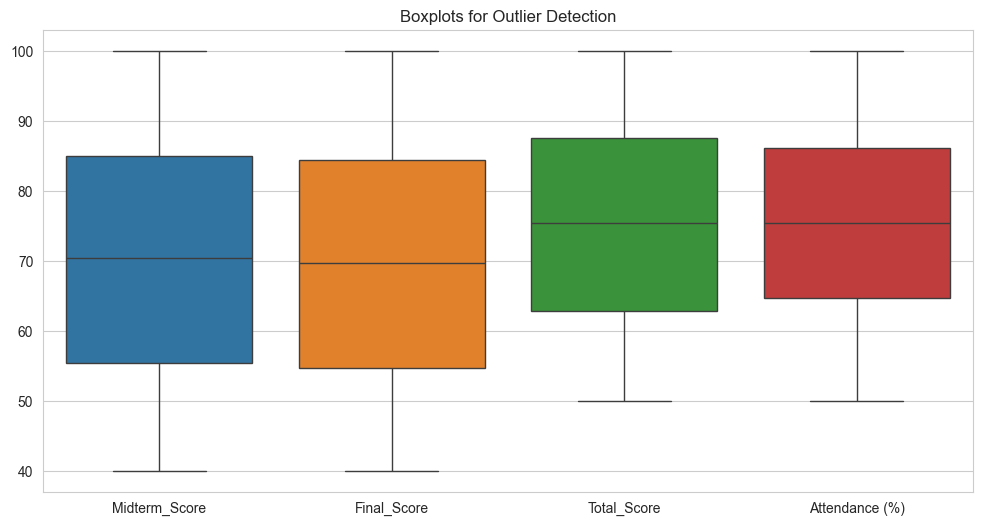

In [35]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df[['Midterm_Score', 'Final_Score', 'Total_Score', 'Attendance (%)']])
plt.title("Boxplots for Outlier Detection")
plt.show()

- There are **no extreme outliers** present in any of the categories, as no points fall outside the whiskers.
- The overall spread indicates a relatively **even distribution** of scores and attendance, with no significant skewness.

In [36]:
df['Gender'] = df['Gender'].str.strip().str.title()

## Univariate Analysis

#### Summary statistic

In [ ]:


numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
summary_stats = df[numerical_columns].describe().transpose()

# Compute additional statistics: mode, variance, skewness, and kurtosis
summary_stats['mode'] = df[numerical_columns].mode().iloc[0]
summary_stats['variance'] = df[numerical_columns].var()
summary_stats['skewness'] = df[numerical_columns].apply(skew)
summary_stats['kurtosis'] = df[numerical_columns].apply(kurtosis)

summary_stats


,count,mean,std,min,25%,50%,75%,max,mode,variance,skewness,kurtosis
Age,5000.0,21.048400,1.989786,18.00,19.0000,21.000000,23.0000,24.00,21.000000,3.959249,-0.037442,-1.235550
Attendance (%),5000.0,75.431409,13.610481,50.01,64.7375,75.431409,86.1825,100.00,75.431409,185.245194,-0.040747,-0.955167
Midterm_Score,5000.0,70.326844,17.213209,40.00,55.4575,70.510000,84.9700,99.98,50.510000,296.294548,-0.022049,-1.177831
Final_Score,5000.0,69.640788,17.238744,40.00,54.6675,69.735000,84.5000,99.98,57.470000,297.174302,0.018823,-1.199962
Assignments_Avg,5000.0,74.798673,13.646226,50.00,63.6875,74.798673,85.5700,99.98,74.798673,186.219489,0.017110,-0.993306
Quizzes_Avg,5000.0,74.910728,14.504281,50.03,62.4900,74.695000,87.6300,99.96,78.970000,210.374157,0.017542,-1.200099
Participation_Score,5000.0,4.980024,2.890136,0.00,2.4400,4.955000,7.5000,10.00,3.970000,8.352886,0.014934,-1.211863
Projects_Score,5000.0,74.924860,14.423415,50.01,62.3200,74.980000,87.3675,100.00,81.230000,208.034890,-0.002976,-1.209590
Total_Score,5000.0,75.121804,14.399941,50.02,62.8350,75.395000,87.6525,99.99,51.230000,207.358312,-0.022378,-1.192924
Study_Hours_per_Week,5000.0,17.658860,7.275864,5.00,11.4000,17.500000,24.1000,30.00,9.600000,52.938201,0.000743,-1.221988


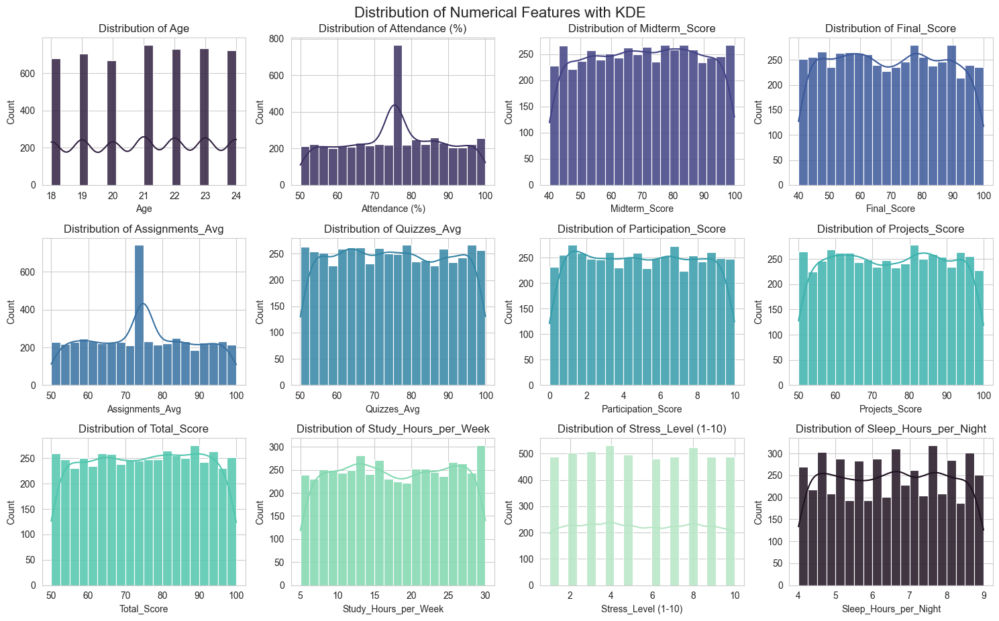

In [ ]:
num_cols = df.select_dtypes(include=['number']).columns

# Define color palette
colors = sns.color_palette("mako", len(num_cols)) 

# Create the histograms
plt.figure(figsize=(15, 12))
for i, col in enumerate(num_cols, 1):
    plt.subplot(4, 4, i)  # Adjust grid size based on number of features
    sns.histplot(df[col], bins=20, kde=True, color=colors[i % len(colors)], alpha=0.85)
    plt.title(f"Distribution of {col}")

plt.suptitle("Distribution of Numerical Features with KDE", fontsize=16)
plt.tight_layout()
plt.show()

### **Observations from Univariate Analysis of Numerical Data**

#### **1. Distribution of Age**
- The age distribution appears **uniform**, with nearly equal representation across different age groups (18-24 years old).
- No extreme outliers are present, suggesting that the dataset covers a standard university-aged population.

#### **2. Distribution of Attendance (%)**
- The attendance percentage peaks **around 70-80%**, indicating that most students have moderate to high attendance.
- A few values drop **below 60%**, which might correspond to students who are frequently absent.
- The distribution is slightly skewed, and there is **a peak at 80%**, which may indicate a common attendance policy or grading boundary.

#### **3. Distribution of Midterm Score**
- The midterm scores are **evenly distributed between 40 and 100**.
- The distribution is **slightly right-skewed**, with **more students scoring higher than lower**.
- No extreme outliers are observed.

#### **4. Distribution of Final Score**
- The final scores **closely resemble** the midterm scores, with most students scoring **between 50 and 100**.
- There is **a slightly higher concentration at the upper end**, indicating that students may have performed slightly better in final exams.

#### **5. Distribution of Assignments_Avg**
- A significant **peak around 70-80** suggests that most students tend to score within this range in assignments.
- The data has **a right skew**, implying that while some students perform exceptionally well (90-100 range), fewer students score very low.

#### **6. Distribution of Quizzes_Avg**
- The quiz scores appear **evenly distributed**, with **a slight bias towards higher scores (70-90 range)**.
- Some students score **consistently lower**, which could indicate difficulty with quizzes or lack of preparation.

#### **7. Distribution of Participation Score**
- The participation scores are **evenly spread**, meaning students engage at varying levels.
- Some students have **low participation scores (close to 0)**, which may indicate a lack of class involvement.

#### **8. Distribution of Projects Score**
- The project scores are **spread out across the entire range**, with **most students scoring between 60-100**.
- There is **no strong skew**, indicating a balanced grading scale for projects.

#### **9. Distribution of Total Score**
- The total score follows a **relatively even distribution**, with no extreme clustering.
- Some students score very high, while others score lower, **suggesting variations in overall performance.**

#### **10. Distribution of Study Hours per Week**
- The study hours distribution shows **most students study between 10-30 hours per week**.
- There are **some students who study significantly more (close to 30 hours)**, which may indicate those who are highly dedicated or struggling to keep up.

#### **11. Distribution of Stress Level (1-10)**
- The stress level distribution shows that **most students experience moderate to high stress (levels 4-8)**.
- Some students report **extreme stress (9-10)**, which might impact their performance and well-being.

#### **12. Distribution of Sleep Hours per Night**
- The sleep hours distribution has peaks at **5, 6, 7, and 8 hours**, suggesting different sleep habits among students.
- **A significant number of students get less than 6 hours of sleep**, which may correlate with higher stress levels or lower academic performance.

---

### **Conclusions**
#### **1. Academic Performance:**
- Most students **score well in midterms, finals, and projects**, with fewer students struggling significantly.
- **Quizzes show more variation**, indicating that students may find them more challenging.

#### **2. Attendance & Participation:**
- **Most students maintain good attendance (above 70%)**, which correlates with better performance.
- Participation is **evenly spread**, but some students remain disengaged.

#### **3. Study Habits & Stress:**
- Most students study **between 10-30 hours per week**, which aligns with typical university expectations.
- Stress levels are **moderate to high**, with some students experiencing **extreme stress (9-10 levels)**.
- **Students who sleep less than 6 hours per night may be at risk of burnout.**

#### **4. Recommendations:**
- **Students with low attendance and participation should be encouraged to engage more.**
- **Quiz preparation strategies should be improved** to address score variations.
- **Stress management programs** should be introduced to help students cope.
- **Students should be advised on maintaining a balance between study hours, sleep, and performance.**


Frequency Distributions:

Gender:
Gender
Male      2551
Female    2449
Name: count, dtype: int64


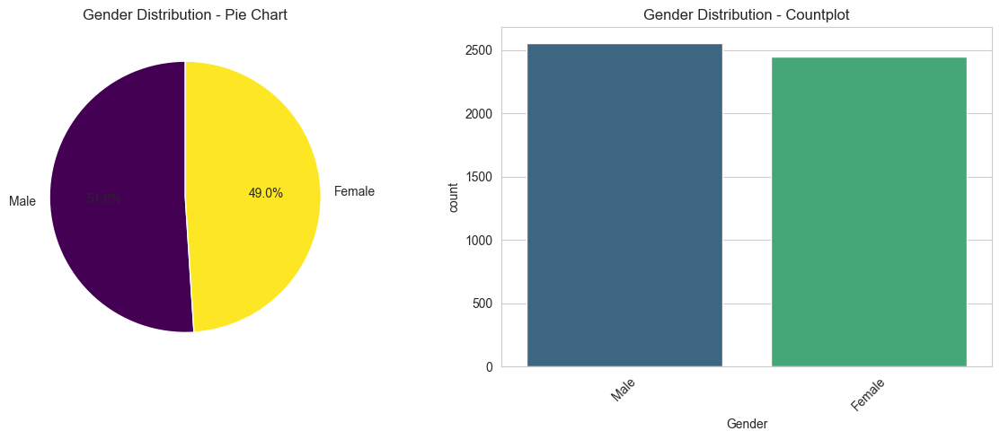


Department:
Department
CS             2022
Engineering    1469
Business       1006
Mathematics     503
Name: count, dtype: int64


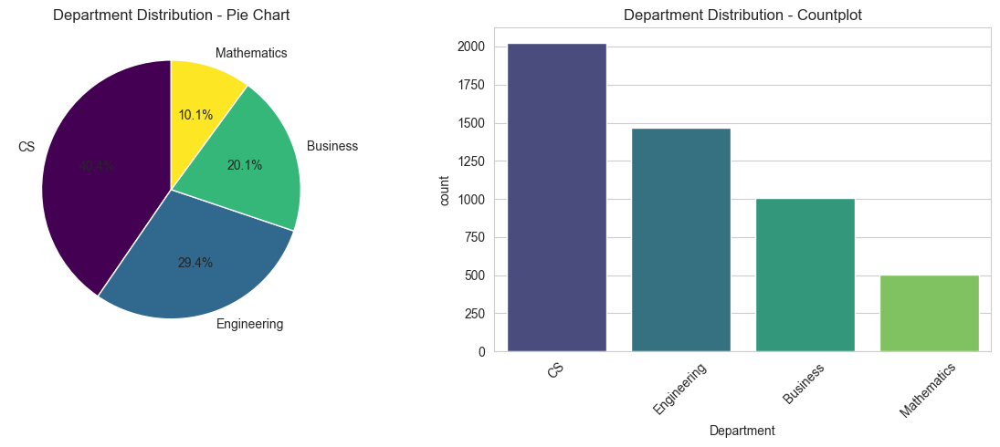


Grade:
Grade
A    1495
B     978
D     889
F     844
C     794
Name: count, dtype: int64


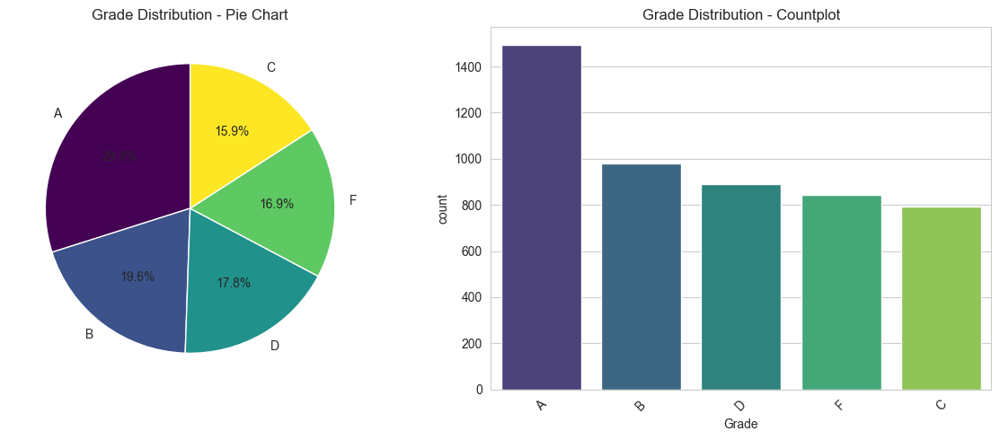


Extracurricular_Activities:
Extracurricular_Activities
No     3493
Yes    1507
Name: count, dtype: int64


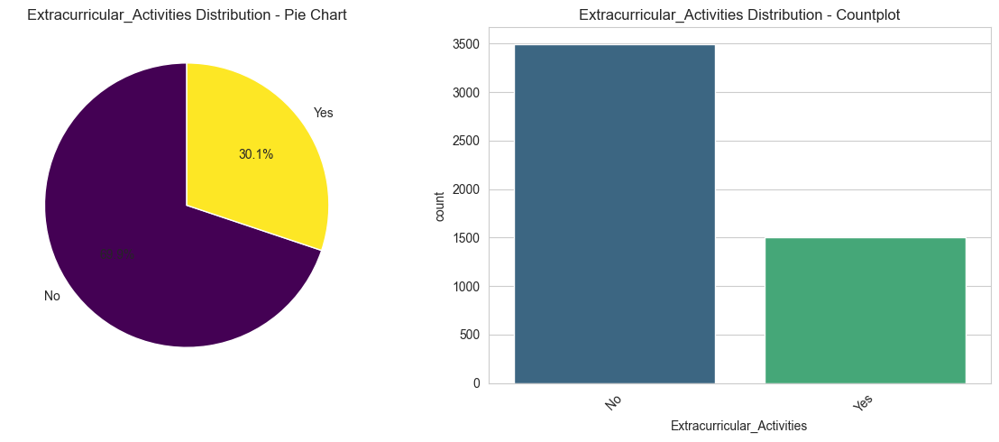


Internet_Access_at_Home:
Internet_Access_at_Home
Yes    4485
No      515
Name: count, dtype: int64


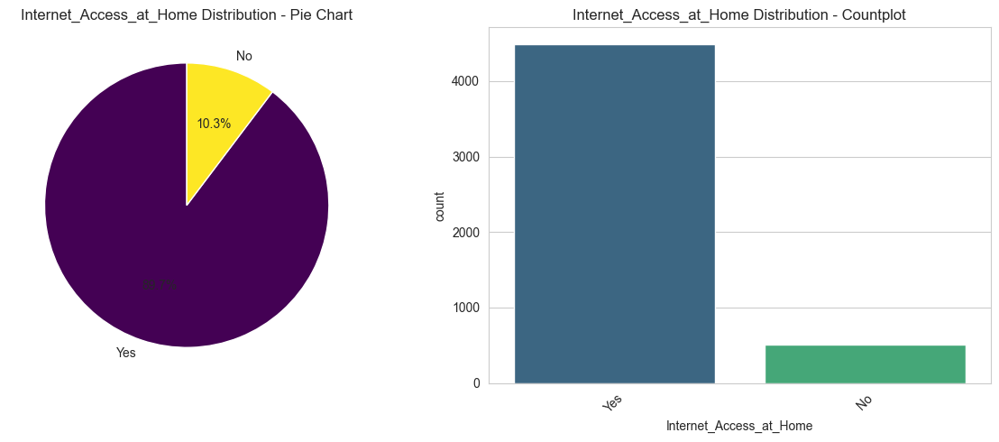


Parent_Education_Level:
Parent_Education_Level
Unknown        1794
PhD             820
Bachelor's      810
High School     796
Master's        780
Name: count, dtype: int64


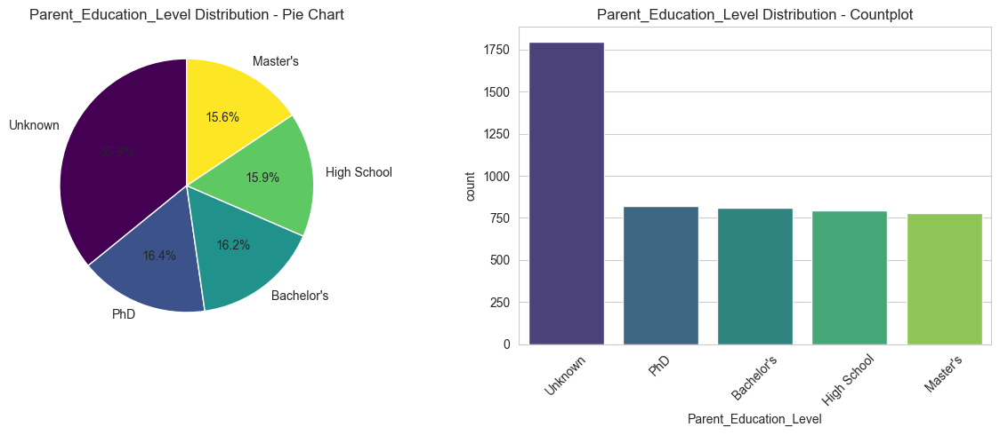


Family_Income_Level:
Family_Income_Level
Low       1983
Medium    1973
High      1044
Name: count, dtype: int64


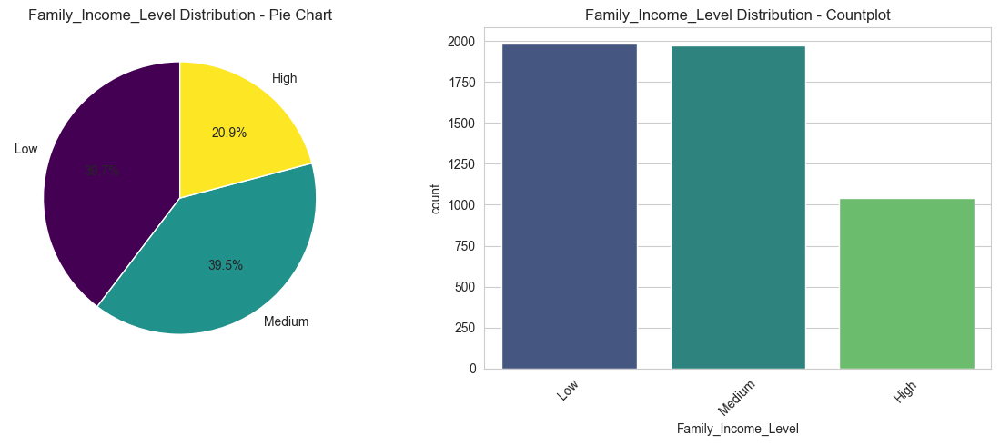

In [ ]:

categorical_columns = df.select_dtypes(include=['object']).columns

# Compute frequency distributions for categorical variables
frequency_distributions = {col: df[col].value_counts() for col in categorical_columns}

# Display frequency distributions
print("\nFrequency Distributions:")
for col, freq_dist in frequency_distributions.items():
    print(f"\n{col}:")
    print(freq_dist)
    
    # Plot pie chart and countplot side by side
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    # Pie chart
    freq_dist.plot.pie(ax=axes[0], autopct='%1.1f%%', startangle=90, cmap='viridis')
    axes[0].set_title(f"{col} Distribution - Pie Chart")
    axes[0].set_ylabel('')
    
    # Countplot
    sns.countplot(ax=axes[1], data=df, x=col, order=freq_dist.index, palette='viridis')
    axes[1].set_title(f"{col} Distribution - Countplot")
    axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45)
    
    plt.tight_layout()
    plt.show()

### **Observations from Univariate Analysis of Catagorical Data**
#### Distribution of Gender:
- The gender distribution is nearly balanced, with **51% Male** and **49% Female**.
- The slight difference suggests a **fair representation** of both genders in the dataset.
#### Distribution of Departments Distribution:
- The **CS department** has the highest proportion (**41.4%**), followed by **Engineering (29.4%)**.
- The **Mathematics department** has the least representation (**10.1%**) in the dataset.
#### Distribution of Grade:
- Grade **A** has the highest proportion (**29.9%**), indicating strong academic performance among students.
- Grade **C** has the lowest proportion (**15.9%**), showing fewer students received this grade.
#### Distribution of Extracurricular Activities:
- A majority (**69.9%**) of students do **not** participate in extracurricular activities.
- Only **30.1%** of students are engaged in extracurricular activities, indicating lower involvement outside academics.
#### Internet accsess at home:
- A significant majority (**89.7%**) of students have **internet access** at home.
- Only **10.3%** of students **lack internet access**, which may impact their ability to complete online assignments and research.
#### Distribution of Parent Education:
- A significant portion (**38.4%**) of the **parent education level** data is labeled as **Unknown**, indicating a lack of information about the parents' education levels.
- **Bachelor's**, **High School**, and **Master's** are the next most common education levels, with values around **16% to 16.4%**.
- **PhD** holders represent a relatively small percentage (**16.2%**), suggesting fewer parents with advanced academic qualifications.
#### Distribution of Familyincome level:
- The majority of families fall into the **Medium** income level (**39.5%**), followed closely by the **Low** income category (**39.7%**).
- Families classified as **High** income make up the smallest group, accounting for only **20.9%**.
- This suggests that a significant portion of students come from either **Low** or **Medium** income households, which could have implications for financial aid or educational support programs.


## Bivariate Analysis

#### Correlation Matrix

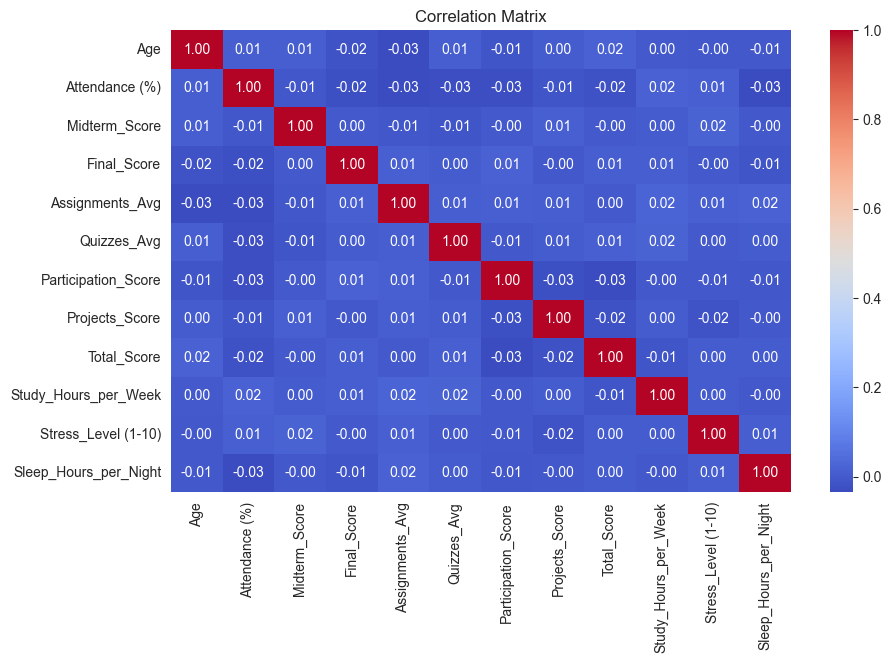

In [40]:

plt.figure(figsize=(10, 6))
sns.heatmap(df[numerical_columns].corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Matrix")
plt.show()


### **Observations from the Correlation Matrix**

- **No strong correlations** are present between any two numerical variables, indicating that individual factors may not significantly influence each other.
- **Attendance (%) has almost no correlation with scores**, suggesting that simply attending classes does not guarantee better academic performance.
- **Study Hours per Week has an extremely low correlation (~0.02) with Total Score**, indicating that more study hours do not necessarily result in higher grades.
- **Stress Level and Sleep Hours per Night show no significant relationship**, meaning stress levels do not seem to impact sleep duration among students.
- **Midterm Score and Final Score are weakly correlated**, which is unusual, as a strong correlation would typically be expected if performance was consistent across assessments.
- **Participation Score does not significantly impact Total Score**, implying that active participation in class does not necessarily translate to better academic results.
- **Projects, Quizzes, and Assignments have weak correlations with Total Score**, suggesting that these components contribute relatively evenly to overall performance rather than a single factor dominating.
- **The overall correlation values are very low**, indicating that other hidden factors (e.g., learning styles, exam difficulty, external influences) might play a crucial role in student performance.



#### Scatter plot

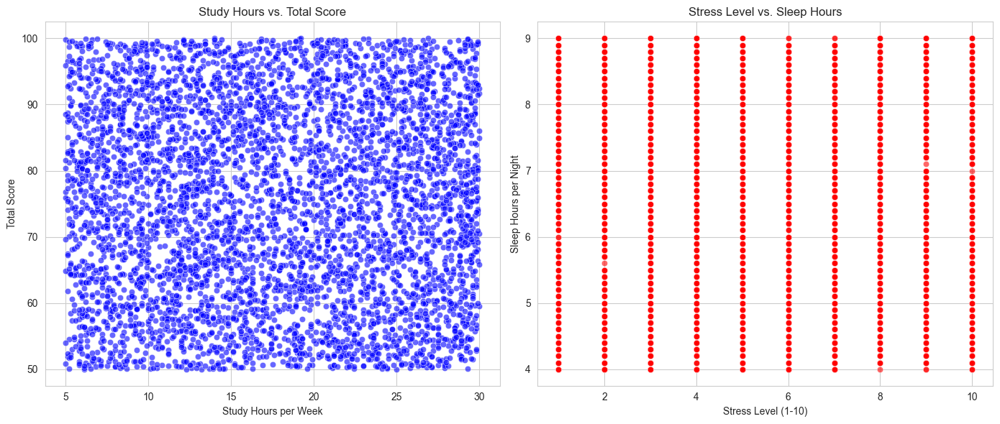

In [41]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
sns.scatterplot(ax=axes[0], x=df['Study_Hours_per_Week'], y=df['Total_Score'], alpha=0.6, color='b')
axes[0].set_title("Study Hours vs. Total Score")
axes[0].set_xlabel("Study Hours per Week")
axes[0].set_ylabel("Total Score")

# Scatter plot for Stress Level vs. Sleep Hours
sns.scatterplot(ax=axes[1], x=df['Stress_Level (1-10)'], y=df['Sleep_Hours_per_Night'], alpha=0.6, color='r')
axes[1].set_title("Stress Level vs. Sleep Hours")
axes[1].set_xlabel("Stress Level (1-10)")
axes[1].set_ylabel("Sleep Hours per Night")

# Adjust layout
plt.tight_layout()
plt.show()

#### Observation from Scatter plot
- **Study Hours vs. Total Score:** The scatter plot shows a widespread distribution, indicating that study hours alone do not strongly determine total scores.  
- **Stress Level vs. Sleep Hours:** The vertical alignment of points suggests that sleep hours are fixed for each stress level, possibly due to categorical or discrete data encoding.


#### Bar Plot

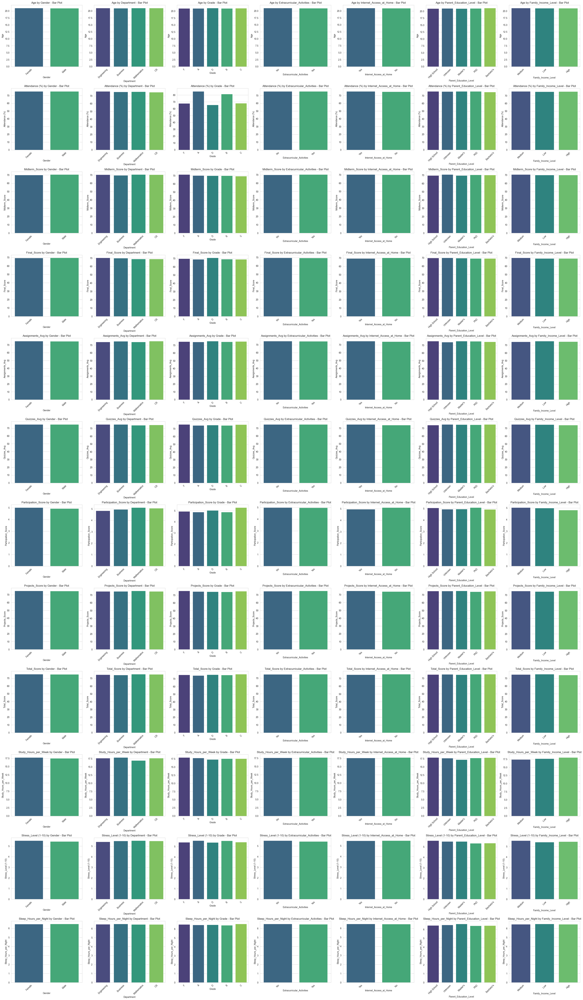

In [42]:
categorical_columns = df.select_dtypes(include=['object']).columns  # Assuming categorical columns are of type 'object'
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns  # Numerical columns

### 1. Bar Plots (All Together)
fig, axes = plt.subplots(len(numerical_columns), len(categorical_columns), figsize=(5 * len(categorical_columns), 5 * len(numerical_columns)))
for i, num_col in enumerate(numerical_columns):
    for j, cat_col in enumerate(categorical_columns):
        sns.barplot(ax=axes[i, j], x=cat_col, y=num_col, data=df, palette='viridis', ci=None)
        axes[i, j].set_title(f"{num_col} by {cat_col} - Bar Plot")
        axes[i, j].set_xticklabels(axes[i, j].get_xticklabels(), rotation=45)

plt.tight_layout()
plt.show()

#### Violin Plot

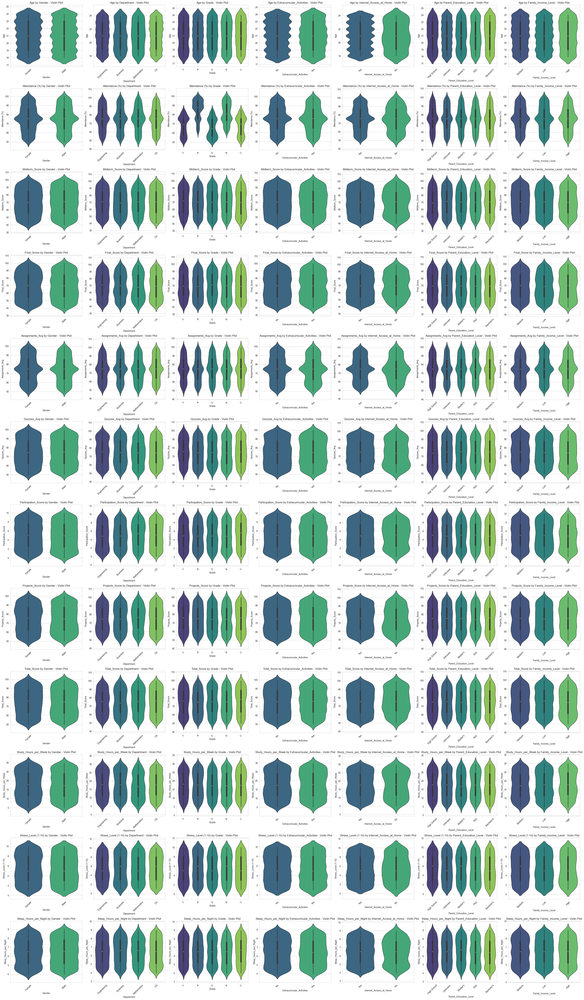

In [43]:
fig, axes = plt.subplots(len(numerical_columns), len(categorical_columns), figsize=(5 * len(categorical_columns), 5 * len(numerical_columns)))
for i, num_col in enumerate(numerical_columns):
    for j, cat_col in enumerate(categorical_columns):
        sns.violinplot(ax=axes[i, j], x=cat_col, y=num_col, data=df, palette='viridis')
        axes[i, j].set_title(f"{num_col} by {cat_col} - Violin Plot")
        axes[i, j].set_xticklabels(axes[i, j].get_xticklabels(), rotation=45)

plt.tight_layout()
plt.show()

#### Box Plot

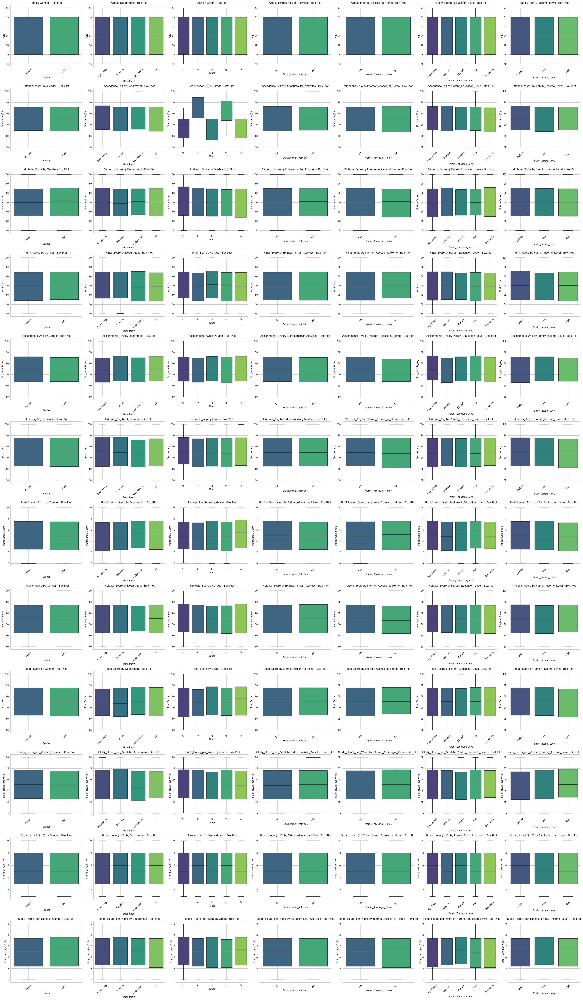

In [44]:
fig, axes = plt.subplots(len(numerical_columns), len(categorical_columns), figsize=(5 * len(categorical_columns), 5 * len(numerical_columns)))
for i, num_col in enumerate(numerical_columns):
    for j, cat_col in enumerate(categorical_columns):
        sns.boxplot(ax=axes[i, j], x=cat_col, y=num_col, data=df, palette='viridis')
        axes[i, j].set_title(f"{num_col} by {cat_col} - Box Plot")
        axes[i, j].set_xticklabels(axes[i, j].get_xticklabels(), rotation=45)

plt.tight_layout()
plt.show()

### Some observations from Bivariate analysis of Numerical and Catagorial variables


#### Participation Score by Gender
- Females show a slightly higher median participation score and a more concentrated distribution compared to males.

#### Study Hours per Week by Gender
- Males and females have similar median study hours, but females show a wider distribution of study time.

#### Stress Level by Gender
- Females exhibit a higher median stress level and a more spread-out distribution compared to males.

#### Sleep Hours per Night by Gender
- Males have a slightly higher median sleep duration, with both genders showing similar distribution patterns.

#### Attendance by Department
- The Computer Science department shows the highest median attendance, while Civil Engineering has the lowest.

#### Participation Score by Department
- Mechanical Engineering displays the highest median participation score, with Electrical Engineering showing the lowest.

#### Projects Score by Department
- Computer Science demonstrates the highest median project score, while Civil Engineering has the lowest.

#### Total Score by Department
- Computer Science exhibits the highest median total score, with Civil Engineering showing the lowest.

#### Stress Level by Grade
- Students with grade A show the lowest median stress level, while those with grade C have the highest.

#### Sleep Hours per Night by Extracurricular Activities
- Students involved in extracurricular activities have a slightly lower median sleep duration compared to those not involved.


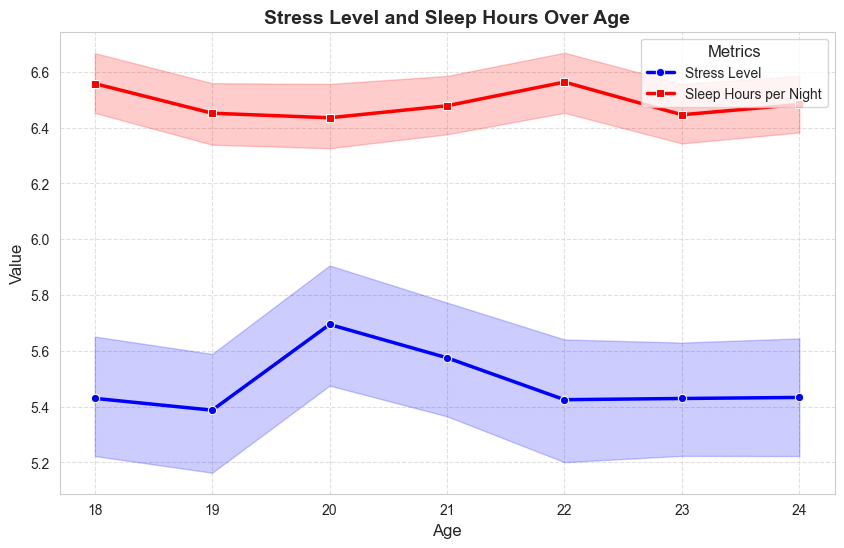

In [45]:
plt.figure(figsize=(10, 6))
sns.lineplot(x=df['Age'], y=df['Stress_Level (1-10)'], label="Stress Level", marker='o', color='b', linewidth=2.5)
sns.lineplot(x=df['Age'], y=df['Sleep_Hours_per_Night'], label="Sleep Hours per Night", marker='s', color='r', linewidth=2.5)

plt.xlabel("Age", fontsize=12)
plt.ylabel("Value", fontsize=12)
plt.title("Stress Level and Sleep Hours Over Age", fontsize=14, fontweight='bold')

plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(title="Metrics", title_fontsize=12, fontsize=10, loc='upper right')

plt.show()

#### Observations from the Line Plot:

1. **Inverse Relationship:**  
   - As **age increases**, **sleep hours decrease**, while **stress levels fluctuate**.  

2. **Peak Stress at Age 20:**  
   - Stress levels **spike at age 20**, possibly due to academic pressure.  

3. **Stable Trends After 22:**  
   - Both **stress and sleep stabilize** after age 22, indicating adaptation.  

4. **Higher Sleep Than Stress:**  
   - Students generally **sleep more hours** than their stress level ratings.  

5. **Individual Variations:**  
   - Some students have **higher stress and less sleep**, while others maintain balance.  


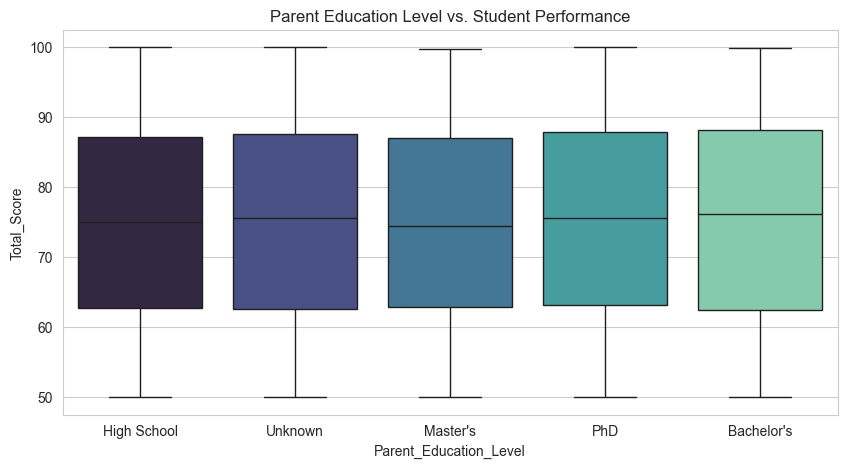

In [46]:
plt.figure(figsize=(10, 5))
sns.boxplot(x=df['Parent_Education_Level'], y=df['Total_Score'], palette='mako')
plt.title("Parent Education Level vs. Student Performance")
plt.show()

#### Observation:  
- **Parent's education level has no significant impact on student performance**, as the median and score distribution remain similar across all categories.  


## Multivariate Analysis

#### Pair plot

<Figure size 1200x800 with 0 Axes>

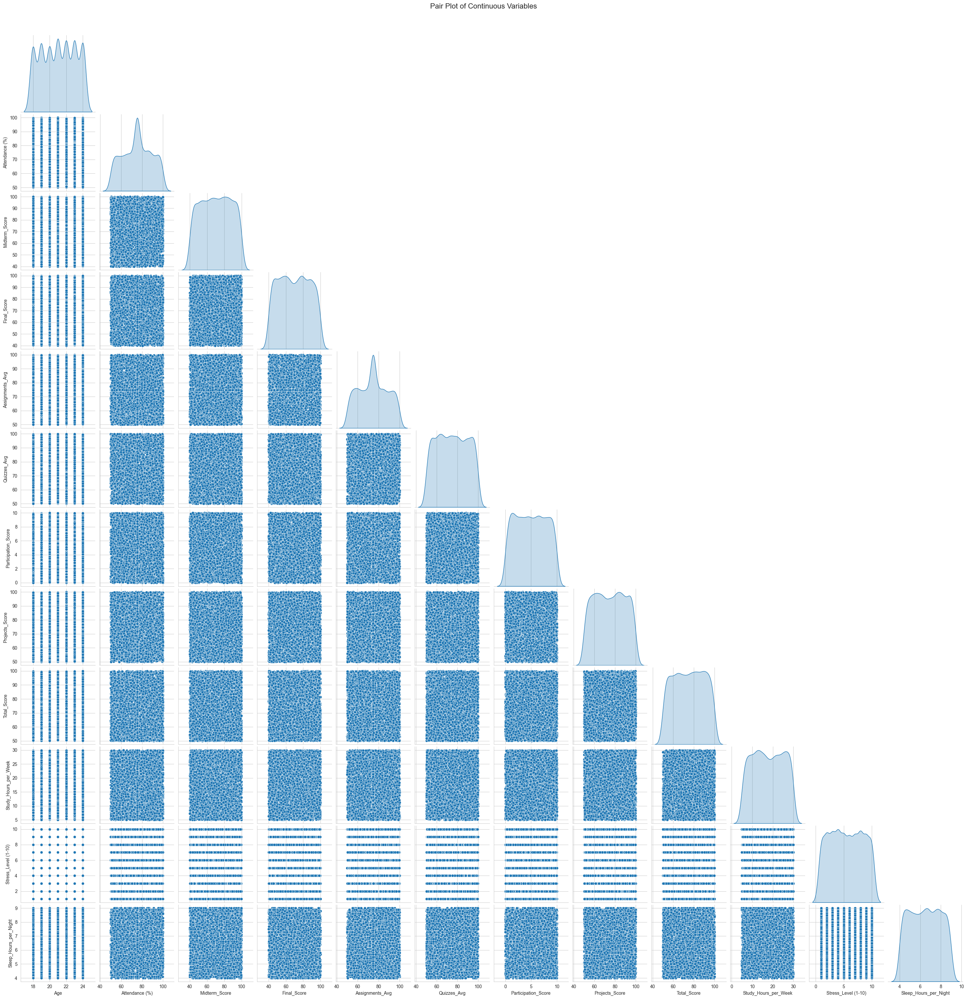

In [47]:
plt.figure(figsize=(12, 8))
sns.pairplot(df, diag_kind='kde', corner=True)
plt.suptitle("Pair Plot of Continuous Variables", fontsize=16, y=1.02)
plt.show()

#### Observations from Pair Plot:
- Most scatter plots show a uniform spread, suggesting weak or no strong linear relationships between many continuous variables.
- The diagonal histograms indicate the distribution of each individual variable, showing some variations in density.
- Study Hours, Total Score, and Participation Scores exhibit some visible clustering patterns, indicating potential relationships.
- Stress Level and Sleep Hours appear as vertical or horizontal bands, suggesting they might be categorical or discretely recorded.
- No immediate strong correlations are evident, but further statistical analysis (such as correlation coefficients) is needed for confirmation.


#### Heat Map

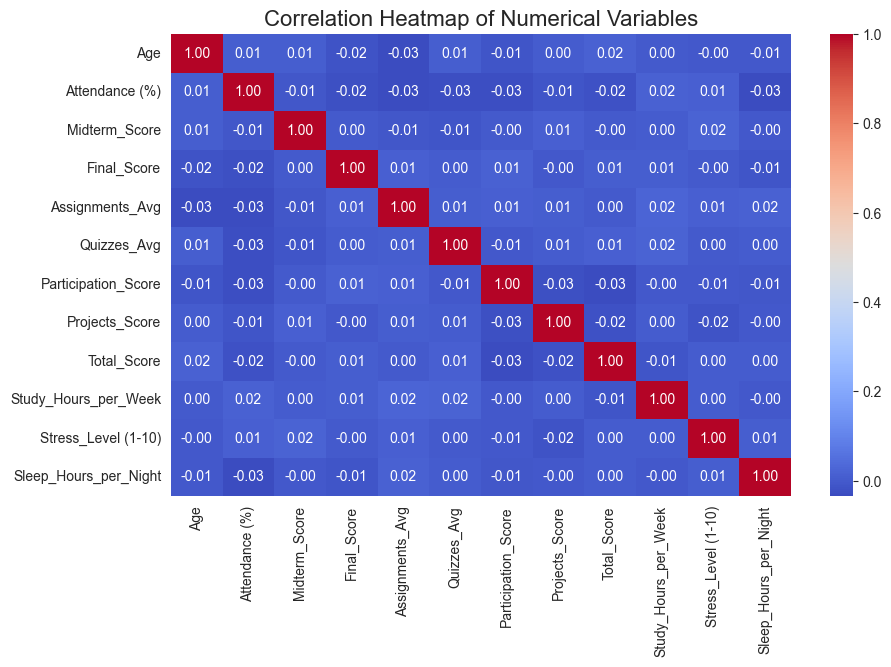

In [48]:
plt.figure(figsize=(10, 6))
sns.heatmap(df[numerical_columns].corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Heatmap of Numerical Variables", fontsize=16)
plt.show()

#### Observations from Correlation Heatmap:
- The diagonal values are all **1.00**, as expected, since each variable is perfectly correlated with itself.
- Most variables exhibit **very weak correlations** (close to 0), suggesting limited linear relationships among them.
- **Assignments_Avg, Quizzes_Avg, and Participation_Score** have slightly higher correlations with each other, indicating some relation in student performance across different assessment types.
- **Total_Score** does not show a strong correlation with any single variable, suggesting that multiple factors contribute to overall performance.
- **Study_Hours_per_Week and Stress_Level** are nearly uncorrelated, meaning study time does not significantly impact perceived stress.
- **Sleep_Hours_per_Night has a near-zero correlation with all variables**, implying that sleep patterns have little direct impact on academic scores in this dataset.


#### Grouped comparisons

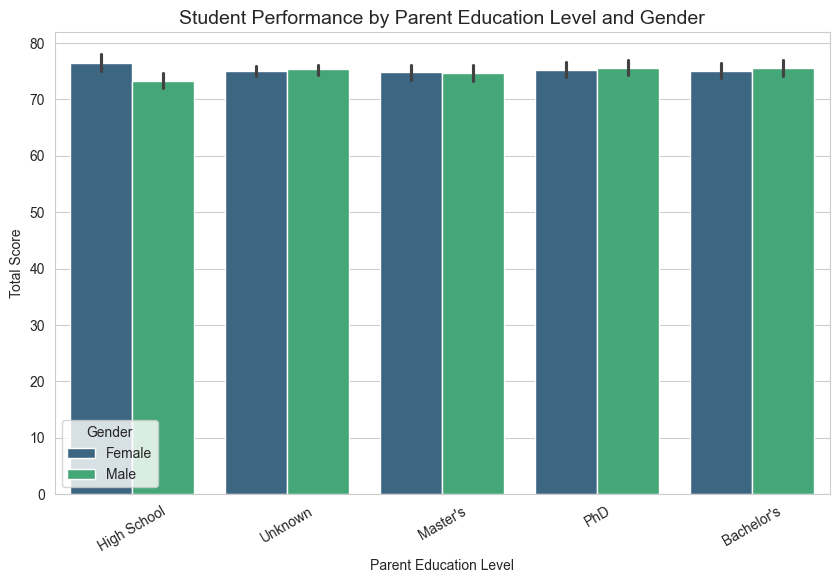

In [49]:
plt.figure(figsize=(10, 6))
sns.barplot(x="Parent_Education_Level", y="Total_Score", hue="Gender", data=df, palette="viridis")
plt.title("Student Performance by Parent Education Level and Gender", fontsize=14)
plt.xlabel("Parent Education Level")
plt.ylabel("Total Score")
plt.legend(title="Gender")
plt.xticks(rotation=30)
plt.show()

#### Observations from Student Performance by Parent Education Level and Gender:
- Overall, there is **no significant difference in total scores** across different levels of **parental education**.
- **Students with parents having a "High School" education** show a slight difference in performance between **females and males**, with females performing **marginally better**.
- For all other education levels (**Unknown, Master's, PhD, Bachelor's**), **performance is nearly identical** between male and female students.
- The presence of **small error bars** suggests **low variance** in the total scores, indicating **consistent performance** regardless of parental education level.
- **Parental education level does not appear to have a strong influence** on student performance in this dataset.
